## Dark frame analyses, part 1: searching for 1/f noise 
**Author**: NE | **Latest update**: Jan 22, 2021

All right, let's start by loading some libraries:

In [65]:
import numpy as np
import glob
import matplotlib.pyplot as plt
from scipy.signal import medfilt

from astropy.timeseries import LombScargle
from astropy.io import fits

### 1. Initial checks and pre-processing

Let's extract all the filenames for NIRCam groups (courtesy of Everett Schlawin!):

In [2]:
files = glob.glob('data/*.fits')

In [3]:
d = fits.open(files[0])
print(d.info())

Filename: data/NRCNRCALONG-DARK-72350742131_1_485_SE_2017-08-23T16h49m51.red_grp_0106.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU    1493   (2048, 2048)   float32   
None


All right, dimension is `(2048 x 2048)`. Let's load all the images into a cube:

In [4]:
data_cube = np.zeros([len(files), 2048, 2048])
for i in range(len(files)):
    d = fits.open(files[i])
    data_cube[i, :, :] = d['PRIMARY'].data

Let's calculate the median of all groups and substract that to each group following <a href="https://ui.adsabs.harvard.edu/abs/2020AJ....160..231S/abstract">Schlawin et al. (2020)</a>. First, calculate (and plot) group median:

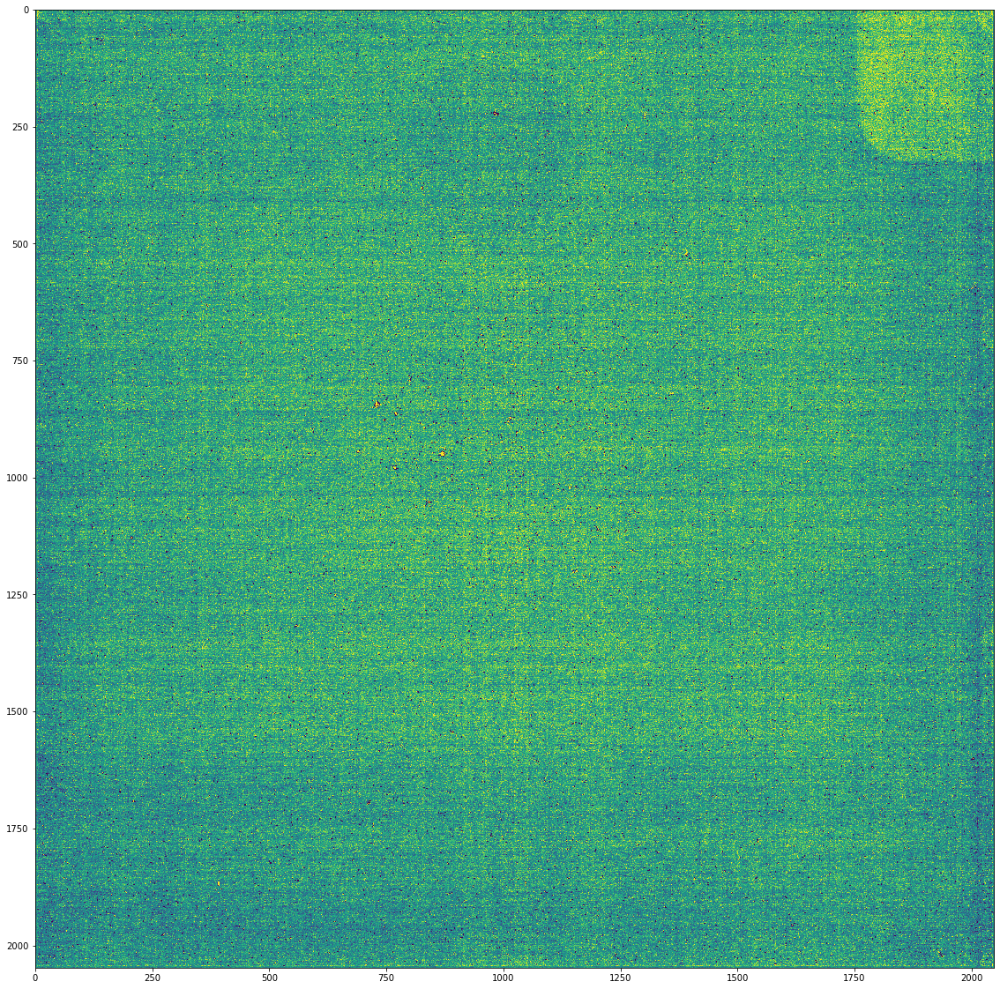

In [5]:
group_median = np.median(data_cube, axis=0)
plt.figure(figsize=(20,20))

im = plt.imshow(group_median)
im.set_clim(-100,100)

Now let's remove this from each group:

In [6]:
for i in range(data_cube.shape[0]):
    data_cube[i, :, :] -= group_median

All right, let's plot a handful of groups to to check how they looks like, and if we can spot some 1/f fluctuations:

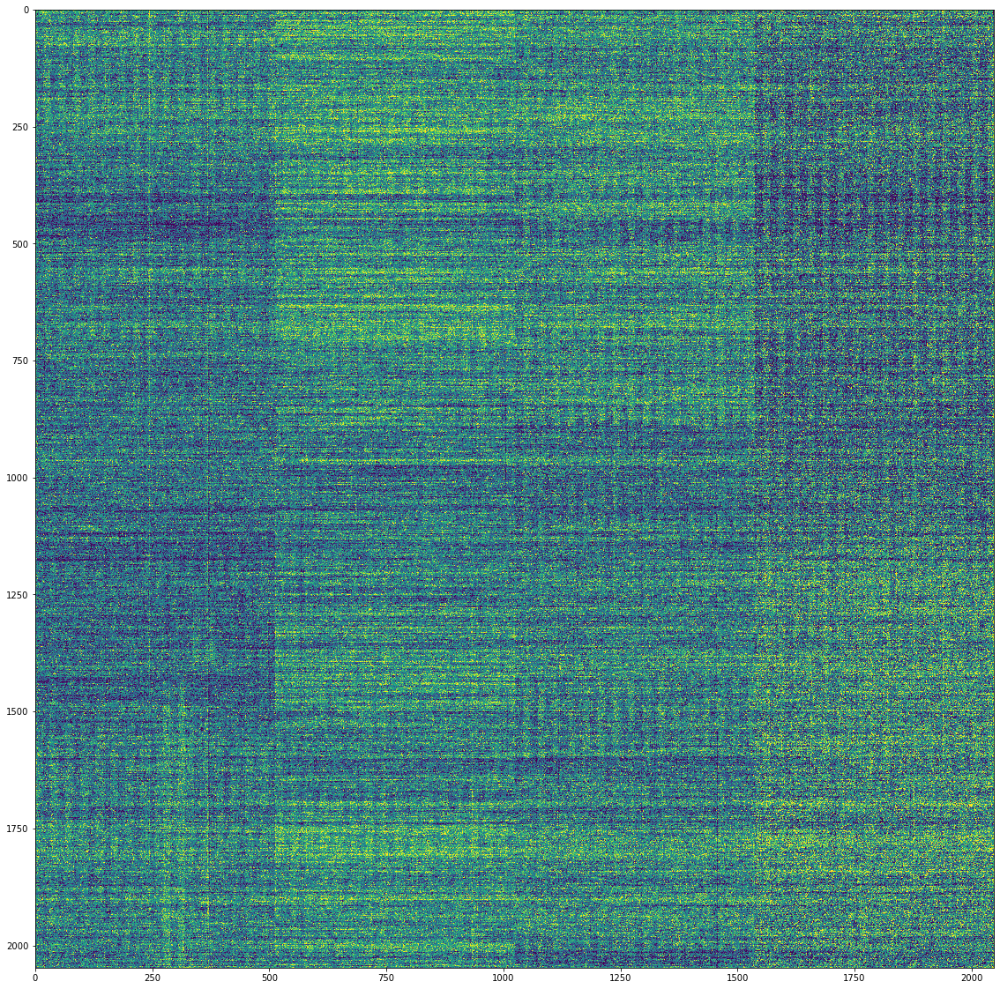

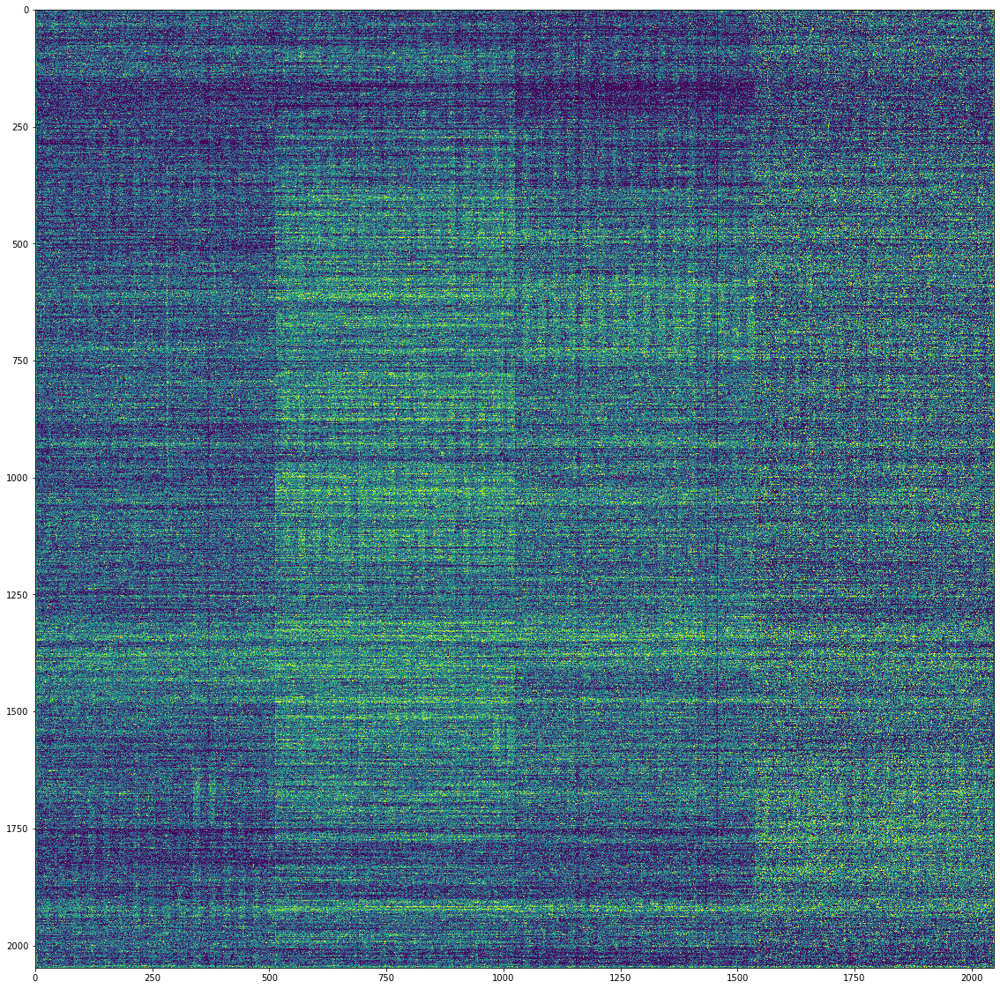

In [7]:
plt.figure(figsize=(20,20))

im = plt.imshow(data_cube[4, :, :])
im.set_clim(-10,10)

plt.figure(figsize=(20,20))

im = plt.imshow(data_cube[1, :, :])
im.set_clim(-10,10)

Awesome! Pretty evident. I've explored some other frames and some are weird, but most of them are like these ones, which by the way are very similar to the ones shown on Figure 4 of Everett's paper. In that Figure, Everett did a close-up to columns 300 to 800 and rows 300 to 800. Let's do the same close-up:

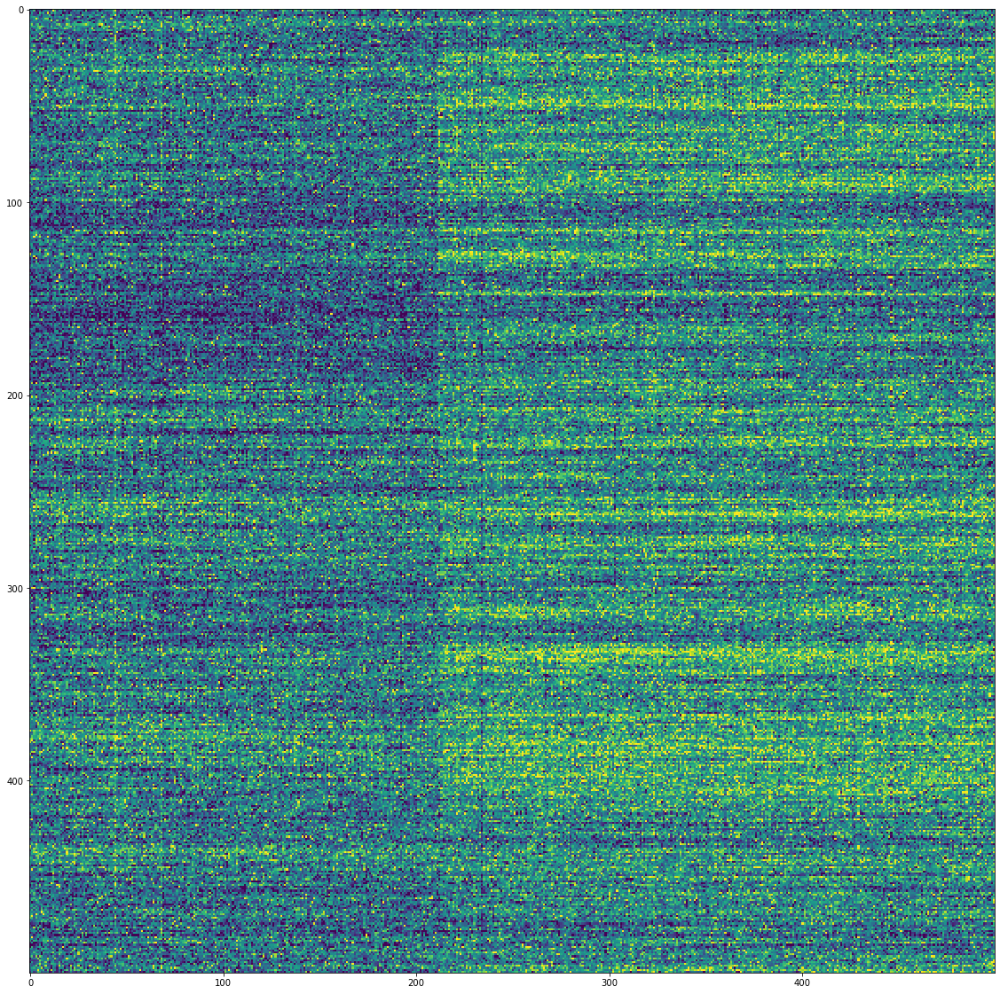

In [8]:
plt.figure(figsize=(20,20))
im = plt.imshow(data_cube[4, 300:800, 300:800])
im.set_clim(-10,10)

Beautiful 1/f pattern! Very similar to the one seen in the paper. Now, let's create a pixel mask on which we mask all pixels deviation by more than 80 DN from the median; this is what Everett did to remove outliers:

In [9]:
pixeldq = np.zeros(data_cube.shape)
for i in range(data_cube.shape[0]):
    idx = np.where(np.abs(data_cube[i,:,:])>80.)[0]
    pixeldq[i,:,:][idx] = -1

In [11]:
pixeldq = np.sum(pixeldq, axis=0)

Let's check that indeed this gives a nice distribution for the fluxes. To this end, let's plot the first group flattened histogram of fluxes:

(array([2.0480000e+03, 2.0480000e+03, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 2.0480000e+03, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 2.0480000e+03,
        8.1920000e+03, 0.0000000e+00, 1.6384000e+04, 6.1440000e+03,
        2.0480000e+04, 2.8672000e+04, 2.4576000e+04, 5.9392000e+04,
        8.6016000e+04, 9.0112000e+04, 1.5974400e+05, 2.5804800e+05,
        3.5840000e+05, 6.2054400e+05, 8.4992000e+05, 1.2042240e+06,
        1.6711680e+06, 2.5313280e+06, 3.2563200e+06, 4.2229760e+06,
        5.4333440e+06, 6.6211840e+06, 8.3353600e+06, 9.7218560e+06,
        1.1192320e+07, 1.2660736e+07, 1.3905920e+07, 1.5106048e+07,
        1.5798272e+07, 1.5798272e+07, 1.5894528e+07, 1.5429632e+07,
        1.6912384e+07, 1.2632064e+07, 1.0969088e+07, 9.5313920e+06,
        7.8909440e+06, 6.1870080e+06, 4.8701440e

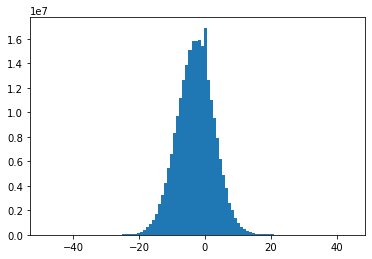

In [24]:
good_pixels = np.where(pixeldq == 0.)[0]
first_group = data_cube[1,:,:]
fd = first_group[good_pixels].flatten()
plt.hist(fd,bins=100)

That looks good! Let's now move to the next step of actually computing the Power Spectral Densities.

### 2. Computing power spectral densities

OK, now we know we have the 1/f patterns. Let's follow <a href="https://ui.adsabs.harvard.edu/abs/2020AJ....160..231S/abstract">Schlawin et al. (2020)</a>, and compute the power spectral density (PSD) of the fluxes on these integrations. 

To this end, we perform the analysis on Amplifier 2 only, which goes from $X=512$ to $X=1023$:

In [17]:
amp2 = data_cube[:,:,512:1023]

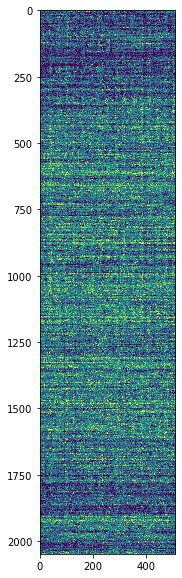

In [18]:
plt.figure(figsize=(10,10))

im = plt.imshow(amp2[1,:,:])
im.set_clim(-10,10)

Let's now convert this from spatial flux values into a time-series of fluxes. To this end, we consider the same time-scales assumed in Everett's paper; namely, that each pixel is read in 10$\mu$s, and that the gaps between rows take 120$\mu$s to jump. Let's work with the second group in our dataset to get an idea of how this will work.

To make it as transparent as possible, let's flatten the flux array manually (there are of course pythonic ways of doing this --- but this illustrates the process much better); let's also count the times to create the time-array. To this end, we start counting from the very first pixel at the top --- count 10 $\mu$s after each pixel, and when we switch rows, we add 120$\mu$s to the times. We ommit counting any pixels that have a bad data quality flag (i.e., a `pixeldq` distinct from zero) --- note that for those we simply skip the pixel, but we still keep counting the current times (`ct` below):

In [20]:
group = amp2[1,:,:]
times = np.array([])
flattened_group = np.array([])

rows, cols = group.shape[0], group.shape[1]
ct = 0
for i in range(rows):
    for j in range(cols):
        ct += 10
        if pixeldq[i,j] == 0.:
            flattened_group = np.append(flattened_group, group[i,j])
            times = np.append(times, ct)
    ct += 120

In [72]:
group.shape

(2048, 511)

Let's plot this time-series (we do a little close-up --- otherwise, it is basically impossible to see anything):

Text(0, 0.5, 'Flux (DN)')

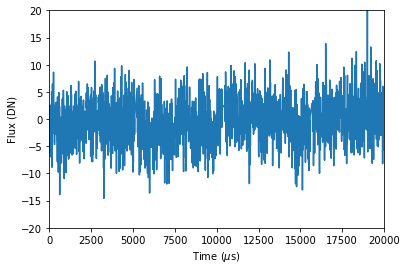

In [37]:
plt.plot(times,flattened_group)
plt.xlim(0,20000)
plt.ylim(-20,20)
plt.xlabel('Time ($\mu$s)')
plt.ylabel('Flux (DN)')

Just to see if we _actually_ did what we wanted to do, let's check if there is a gap in time close to pixel 513:

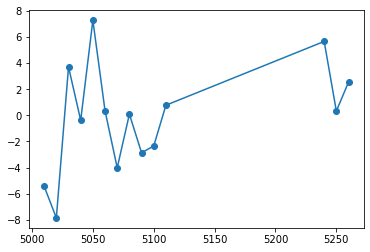

In [77]:
plt.plot(times[500:514],flattened_group[500:514],'o-')

Indeed --- separated by the 120$\mu$s, as we wanted. What about the next cycle?

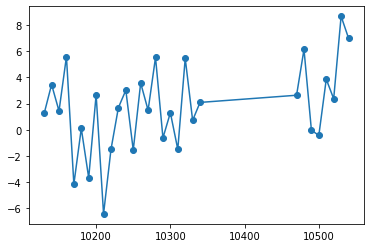

In [78]:
plt.plot(times[1000:1030],flattened_group[1000:1030],'o-')

Same! All is good then; the code did what we wanted.

There's evident correlation between the flux values --- definitely non-gaussian! Let's calculate the power spectral density of this time-series:

In [39]:
frequency, power = LombScargle(times*1e-6, flattened_group).autopower()

(1e-08, 0.01)

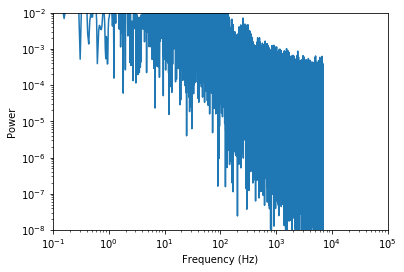

In [42]:
plt.plot(frequency, power)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.xscale('log')
plt.yscale('log')
plt.xlim(0.1,1e5)
plt.ylim(1e-8,1e-2)

The slope is evident in the periodogram! However, it is too noisy. Let's thus repeat the same thing for all the other groups, stack the periodograms, and plot the average one. We also define our own frequency range to define that seen on Everett's paper:

In [93]:
flattened_groups = np.zeros([108, len(flattened_group)])

In [111]:
for n in range(amp2.shape[0]):
    group = amp2[n,:,:]
    counter = 0
    for i in range(rows):
        for j in range(cols):
            if pixeldq[i,j] == 0.:
                flattened_groups[n,counter] = group[i,j]
                counter += 1

In [113]:
frequencies = np.zeros([amp2.shape[0], len(frequency)])

Let's define the same frequencies as in the paper, based on the time-cycles:

In [159]:
new_frequency = np.logspace(-1,4.5,10000)
print(new_frequency)

[1.00000000e-01 1.00126735e-01 1.00253631e-01 ... 3.15427744e+04
 3.15827502e+04 3.16227766e+04]


In [160]:
powers = np.zeros([amp2.shape[0], len(new_frequency)])
for n in range(amp2.shape[0]):
    powers[n,:] = LombScargle(times*1e-6, flattened_groups[n,:]).power(new_frequency)

In [161]:
idx = np.where(~np.isnan(powers[:,0]))[0]

In [162]:
print(idx)

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107]


Let's plot all on top of each other:

(1e-08, 0.1)

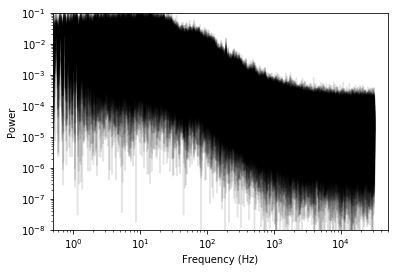

In [163]:
for n in idx:
    plt.plot(new_frequency, powers[n,:],zorder=1,alpha=0.1,color='black')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.xscale('log')
plt.yscale('log')
plt.xlim(0.5,0.5e5)
plt.ylim(1e-8,1e-1)

All right, let's collapse all the lomb-scargle periodograms into one using the median:

(1e-08, 0.1)

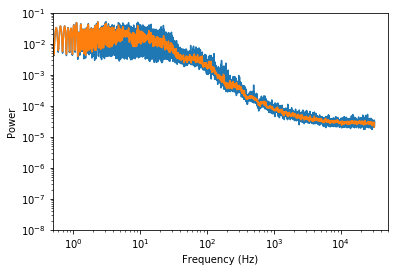

In [164]:
plt.plot(new_frequency, np.median(powers[idx,:],axis=0),zorder=1)
plt.plot(medfilt(new_frequency,11), medfilt(np.median(powers[idx,:],axis=0),11),zorder=2)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.xscale('log')
plt.yscale('log')
plt.xlim(0.5,0.5e5)
plt.ylim(1e-8,1e-1)

According to this analysis, the curve seems to flatten at about $10^4$ Hz, just like in Everett's paper. _However_, we see another flattening below $10$ Hz in our plot here. The power is offset with respect to his paper, which doesn't worry me too much because there are different normalizations of the Y-axis for power spectral densities. 